In [54]:
import cv2
import numpy as np
import math
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

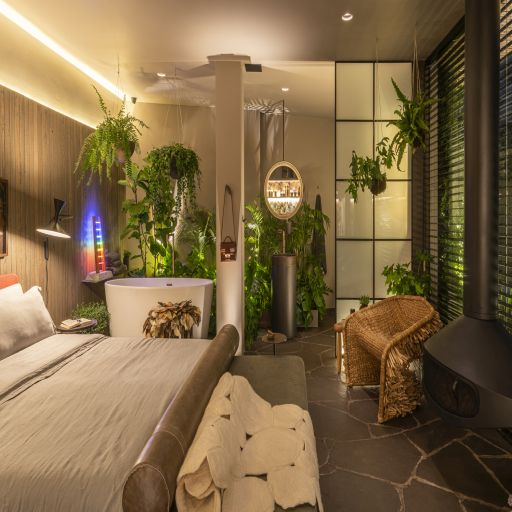

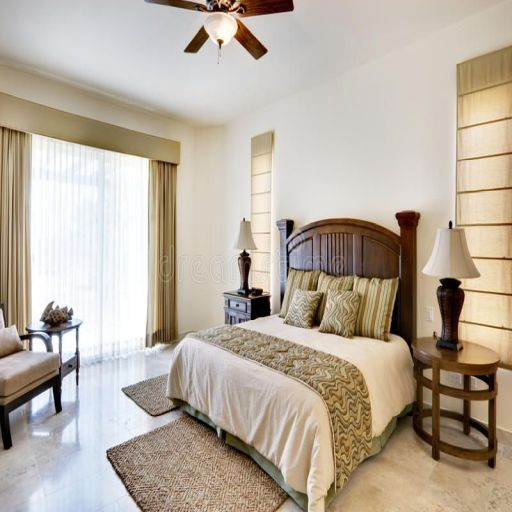

In [55]:
path1 = r'/content/drive/MyDrive/Colab Notebooks/imagesdip/ALTACabana_Urbana_Noite_0787-HDR.jpg'
path2 = r'/content/drive/MyDrive/Colab Notebooks/imagesdip/well_lit_room.jpg'


src = cv2.imread(path1)
src2 = cv2.imread(path2)
  
# Displaying the image 
cv2_imshow(src)
cv2_imshow(src2)

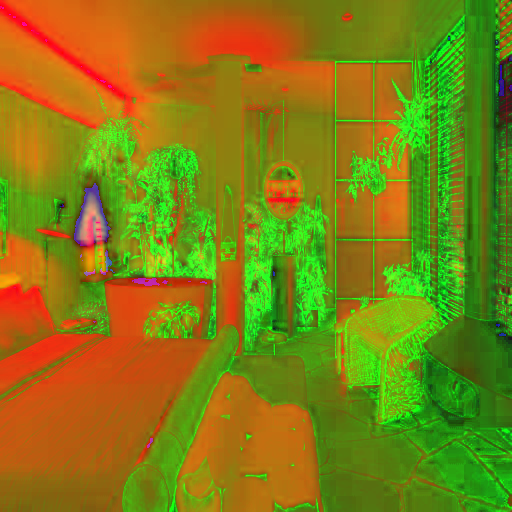

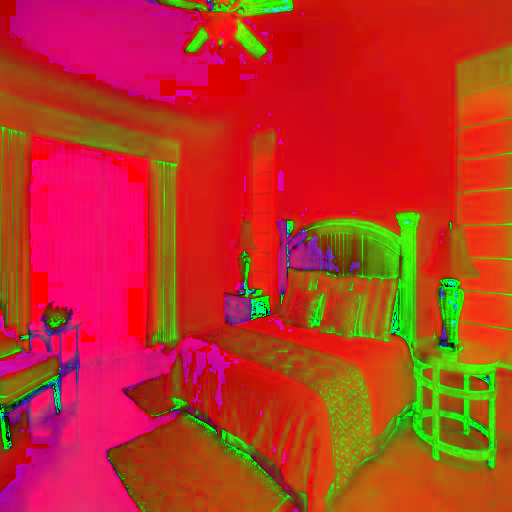

In [56]:
image1 = cv2.cvtColor(src, cv2.COLOR_BGR2HSV )
image2 = cv2.cvtColor(src2, cv2.COLOR_BGR2HSV )

  
# Displaying the image 
cv2_imshow(image1)
cv2_imshow(image2)

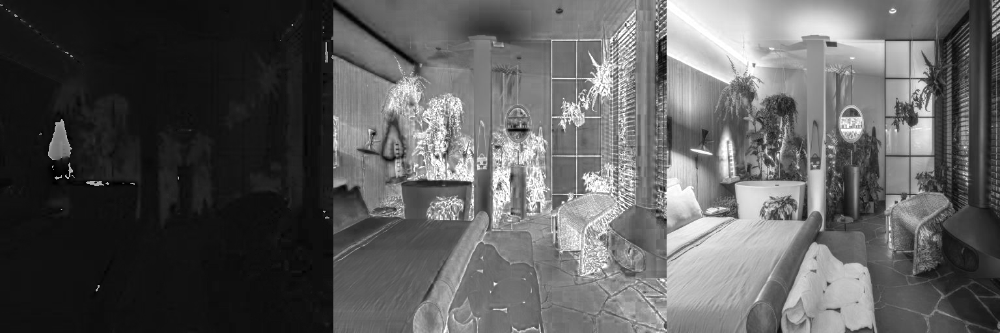

In [57]:
h,s,v = cv2.split(image1)
hsv_split = np.concatenate((h,s,v),axis=1)
cv2_imshow(hsv_split)

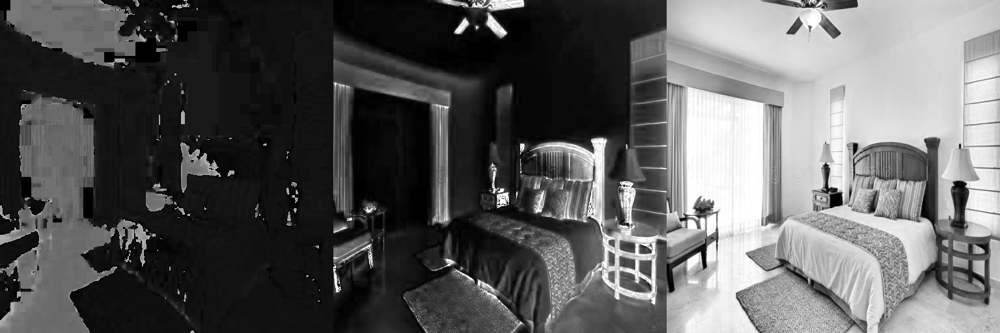

In [58]:
h2,s2,v2 = cv2.split(image2)
hsv_split2 = np.concatenate((h2,s2,v2),axis=1)
cv2_imshow(hsv_split2)

In [59]:
def Hist(image):
    H=np.zeros(256, dtype=np.int)
    s=image.shape
    for i in range(s[0]):
        for j in range(s[1]):
            k=image[i,j]
            H[k]=H[k]+1
    return H

In [60]:
histg = Hist(v)
print(histg)

<ipython-input-59-5f0996f68447>:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  H=np.zeros(256, dtype=np.int)


[   0    0    2    1    2    0    1    7    9    7   10   23   24   43
   54   83   96  131  149  197  280  397  460  527  639  720  734  808
  913  944  950 1034  990 1060 1239 1098 1054 1089 1197 1155 1292 1151
 1074 1132 1119 1075 1149 1193 1047 1121 1128 1247 1240 1345 1336 1207
 1187 1173 1240 1196 1291 1276 1305 1296 1329 1280 1275 1298 1224 1234
 1363 1352 1300 1434 1423 1415 1459 1494 1466 1507 1668 1910 2110 2077
 1948 1923 1757 1648 1554 1558 1439 1403 1278 1289 1322 1285 1221 1176
 1134 1146 1080 1032 1016  969 1001 1112 1100 1222 1275 1245 1208 1205
 1171 1062 1033 1039 1028 1055  994 1021 1021 1026 1146 1104 1043 1011
 1003 1043 1065 1150 1102 1080 1188 1257 1355 1343 1352 1371 1460 1385
 1406 1395 1381 1282 1312 1306 1261 1291 1276 1319 1314 1193 1041 1017
 1055 1099 1073 1024 1139 1073 1120 1118 1084 1061 1057 1089 1138 1156
 1204 1213 1255 1269 1392 1292 1289 1339 1359 1418 1433 1544 1657 1797
 1706 1780 1697 1770 1585 1707 1580 1558 1622 1562 1482 1489 1436 1435
 1327 

In [61]:
histg2 = Hist(v2)
print(histg2)

[  32   87   88  114  115  118  127  122  106  105  109  106  116   96
   98  100  113  100  123  125  120  112  148  141  138  151  143  142
  142  156  164  124  157  142  144  164  193  223  205  208  236  183
  183  193  207  205  191  207  194  187  188  223  229  248  230  234
  257  235  265  249  217  223  251  259  206  255  270  272  269  250
  298  304  335  330  333  349  345  340  343  368  346  343  376  361
  327  299  337  335  368  359  396  385  333  379  344  355  335  328
  317  356  357  345  327  335  335  397  366  339  354  369  403  371
  351  392  382  428  428  420  433  428  420  512  499  526  549  542
  610  683  638  691  660  636  689  672  666  680  654  689  720  753
  731  721  719  748  797  745  780  734  801  884  907  937  959 1046
 1055 1077 1055 1130 1178 1194 1258 1159 1160 1205 1264 1211 1251 1258
 1134 1284 1208 1315 1315 1253 1269 1269 1288 1284 1303 1383 1492 1485
 1470 1551 1586 1717 1621 1628 1602 1641 1715 1650 1692 1738 1881 2059
 2408 

<ipython-input-59-5f0996f68447>:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  H=np.zeros(256, dtype=np.int)


In [62]:
def cumulative_histogram(histogram):
    cumulative = np.zeros(len(histogram),dtype=int)
    cumulative[0] = histogram[0]
    for i in range(1, len(histogram)):
        cumulative[i] = cumulative[i-1] + histogram[i]
    return cumulative

In [63]:
c1 = np.zeros(256, dtype=int)
c2 = np.zeros(256, dtype=int)

In [64]:
c1 = cumulative_histogram(histg)
c2 = cumulative_histogram(histg2)

#print(c1,c2)

In [65]:
m,n = v.shape
mn = m*n
print(m,n,mn)

512 512 262144


In [66]:
A0 = np.zeros((mn,), dtype=int)
A1 = np.zeros((mn,), dtype=int)
A2 = np.zeros((mn,), dtype=int)
A3 = np.zeros((mn,), dtype=int)
A4 = np.zeros((mn,), dtype=int)

In [67]:
q = 0
for i in range(m):
  for j in range(n):
    A0[q] = v[i][j]
    A1[q] = i
    A2[q] = j
    q +=1


In [68]:
print(v,A0,A1,A2)

[[255 252 246 ... 135  63  41]
 [255 254 252 ...  73  43  58]
 [255 255 255 ...  55  62  66]
 ...
 [133 141 131 ...  62  57  52]
 [134 142 129 ...  60  67  82]
 [134 143 129 ...  68  91 126]] [255 252 246 ...  68  91 126] [  0   0   0 ... 511 511 511] [  0   1   2 ... 509 510 511]


In [69]:
A0c = A0.copy()
A1c = A1.copy()
A1c = A1.copy()
A2c = A2.copy()
vc = v2.copy()
print(vc,A0c,A1c,A2c)

[[172 172 173 ... 195 195 194]
 [172 173 173 ... 193 192 192]
 [173 173 173 ... 192 190 189]
 ...
 [173 174 177 ... 188 193 193]
 [176 177 177 ... 189 192 190]
 [178 178 178 ... 190 193 191]] [255 252 246 ...  68  91 126] [  0   0   0 ... 511 511 511] [  0   1   2 ... 509 510 511]


In [70]:
def countingSort(arr, exp1):
 
    n = len(arr)
 

    output = [0] * (n)
    outputA1 = [0] * (n)
    outputA2 = [0] * (n)

 
 
    count = [0] * (10)
 
 
    for i in range(0, n):
        index = arr[i] // exp1
        count[index % 10] += 1
 
    for i in range(1, 10):
        count[i] += count[i - 1]
 
   
    i = n - 1
    while i >= 0:
        index = arr[i] // exp1
        output[count[index % 10] - 1] = arr[i]
        outputA1[count[index % 10] - 1] = A1c[i]
        outputA2[count[index % 10] - 1] = A2c[i]

        count[index % 10] -= 1
        i -= 1
 
  
    i = 0
    for i in range(0, len(arr)):
        arr[i] = output[i]
        A1c[i] = outputA1[i]
        A2c[i] = outputA2[i]

 
# Method to do Radix Sort
def radixSort(arr):
 
    # we know that max number is 255 in the image
    max1 = 255
 
    
    exp = 1
    while max1 / exp >= 1:
        countingSort(arr, exp)
        exp *= 10
 

arr = A0c

radixSort(arr)
 

print(A0c,A1c,A2c)


[  2   2   3 ... 255 255 255] [ 48  50  35 ... 351 352 352] [443 441 456 ... 343 342 343]


In [71]:
print(v[120][368])

66


In [72]:
A3c = A3.copy()
c = 0
for i in range(256):
  #print(i)
  k = histg2[i]
  #print(k)
  for j in range(int(k)):
    A3c[c] = i
    c +=1

In [73]:
print(A3c)

[  0   0   0 ... 255 255 255]


In [74]:
newImage = np.zeros(v.shape,dtype = np.uint8)


In [75]:
l =len(A3c)
print(l)

262144


In [76]:
for i in range(l):
  newImage[A1c[i]][A2c[i]] = A3c[i]

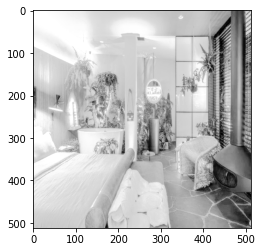

-1

In [77]:
plt.imshow(newImage,cmap='gray')
plt.show()
cv2.waitKey(0)

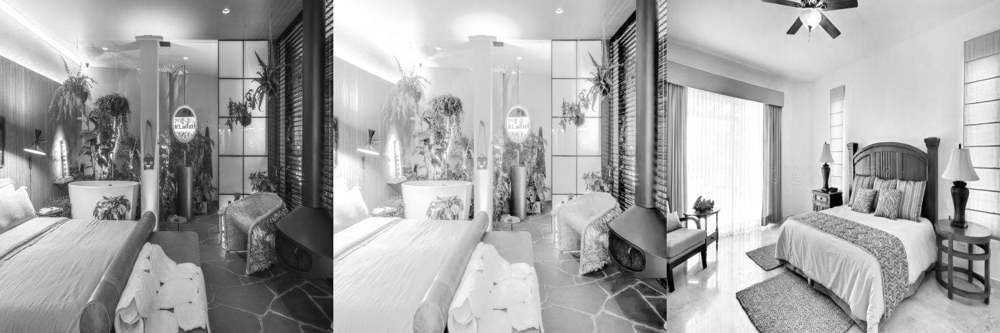

In [78]:
displayImage = np.concatenate((v,newImage,v2),axis=1)
cv2_imshow(displayImage)

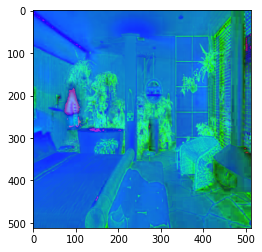

-1

In [79]:
hsv_image1 = cv2.merge((h, s, newImage))

plt.imshow(hsv_image1)
plt.show()
cv2.waitKey(0)

In [80]:
finalImage1 = cv2.cvtColor(hsv_image1, cv2.COLOR_HSV2BGR )
finalImageMon = finalImage1

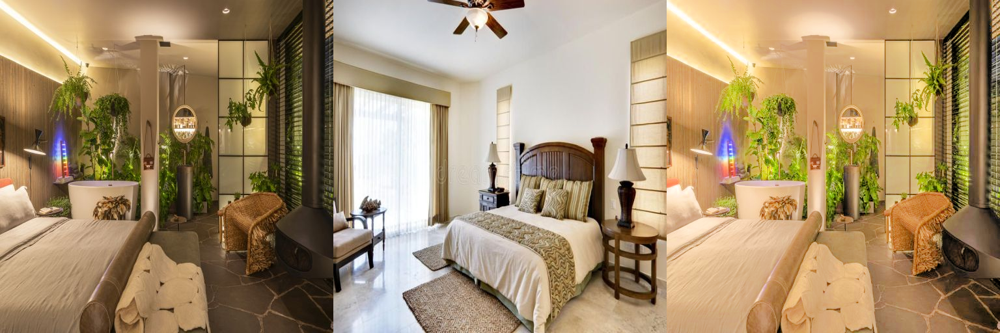

In [81]:
displayimg1 = np.concatenate((src,src2,finalImageMon),axis=1)
cv2_imshow(displayimg1)


Incorporating the Equality Constraint (in addition to the Monotonicity Constraint)

In [82]:
A4 = np.zeros((mn,), dtype=int)

In [83]:
c = c1
A = A4

type(c[0])

numpy.int64

In [84]:
c = c1
A = A4

for k in range(256):

    if k == 0:
        imin = 0
    else:
        imin = c[k-1]

    _sum = 0.0
    for i in range(imin, c[k]):
        _sum += A3c[i]

    if histg[k]==0:
      avg ==0
    else:
      avg = round(_sum / histg[k] )
    for i in range(imin, c[k]):
        A[i] = avg


In [85]:
newImage2 =  np.zeros(v.shape,dtype = np.uint8)


In [86]:
l2 =len(A)
print(l2)

262144


In [87]:
print(A)

[  0   0   0 ... 255 255 255]


In [88]:
for i in range(l):
  newImage2[A1c[i]][A2c[i]] = A[i]

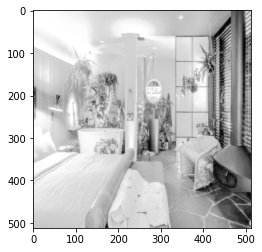

-1

In [89]:
plt.imshow(newImage2,cmap='gray')
plt.show()
cv2.waitKey(0)

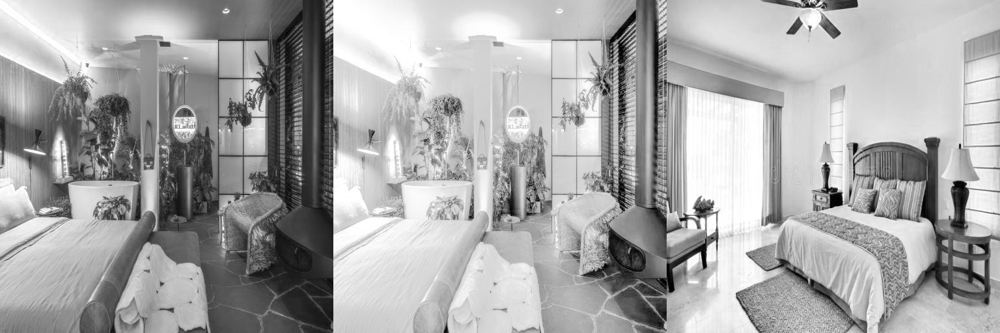

In [90]:
displayImage = np.concatenate((v,newImage2,v2),axis=1)
cv2_imshow(displayImage)

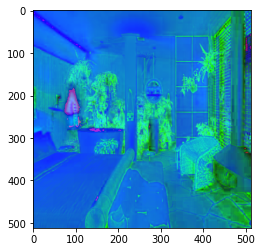

-1

In [91]:
h,s,v = cv2.split(image1)

hsv_image = cv2.merge((h, s, newImage2))

plt.imshow(hsv_image)
plt.show()
cv2.waitKey(0)

In [92]:
finalImage = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR )
finalImageEquality = finalImage

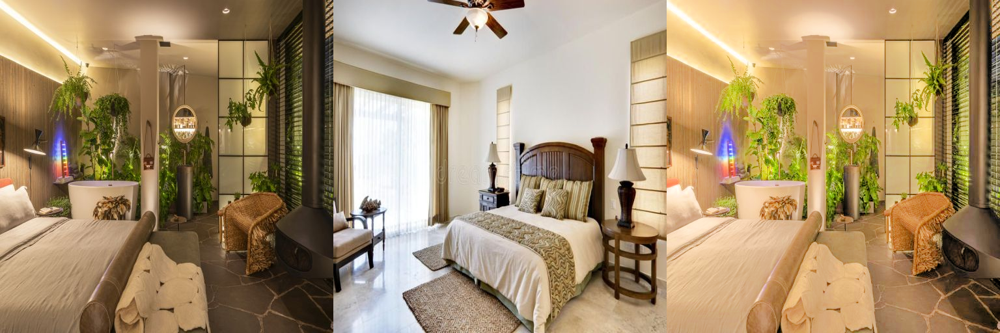

In [93]:
displayimg = np.concatenate((src,src2,finalImageEquality),axis=1)
cv2_imshow(displayimg)

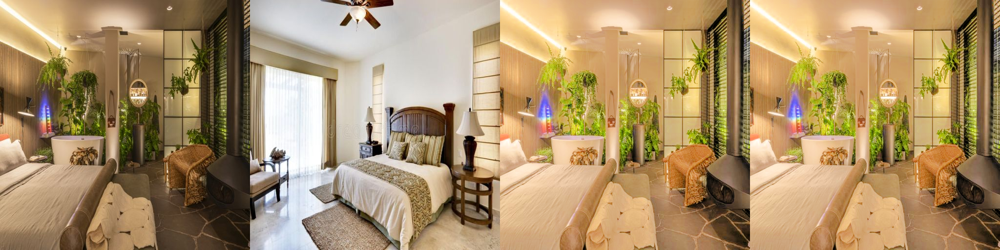

In [94]:
dis = np.concatenate((src,src2,finalImageMon,finalImageEquality),axis=1)
cv2_imshow(dis)

Histogram Equalization

In [95]:
x = histg.reshape(1,256)
y=np.array([])
y = np.append(y,x[0,0])
print("The shape of my histogram",histg.shape)

The shape of my histogram (256,)


In [96]:
s = v.shape
for i in range(255):
    k = x[0,i+1]+y[i]
    y = np.append(y,k)
y = np.round((y/(s[0]*s[1]))*(255)) 

In [97]:
vequalised = np.zeros(v.shape,dtype = np.uint8)
for i in range(s[0]):
    for j in range(s[1]):
        k = v[i,j]
        vequalised[i,j] = y[k]

In [98]:
print(vequalised)

[[255 253 252 ... 136  46  20]
 [255 254 253 ...  58  22  39]
 [255 255 255 ...  36  44  49]
 ...
 [133 144 131 ...  44  38  32]
 [134 145 129 ...  42  51  72]
 [134 146 129 ...  52  87 125]]


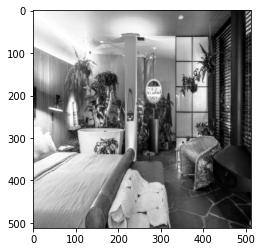

-1

In [99]:
plt.imshow(vequalised,cmap='gray')
plt.show()
cv2.waitKey(0)

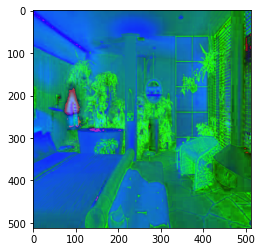

-1

In [100]:
h,s,v = cv2.split(image1)

hsv_image3 = cv2.merge((h, s, vequalised))

plt.imshow(hsv_image3)
plt.show()
cv2.waitKey(0)

In [101]:
finalImage3 = cv2.cvtColor(hsv_image3, cv2.COLOR_HSV2BGR )
finalImageHistEq = finalImage3

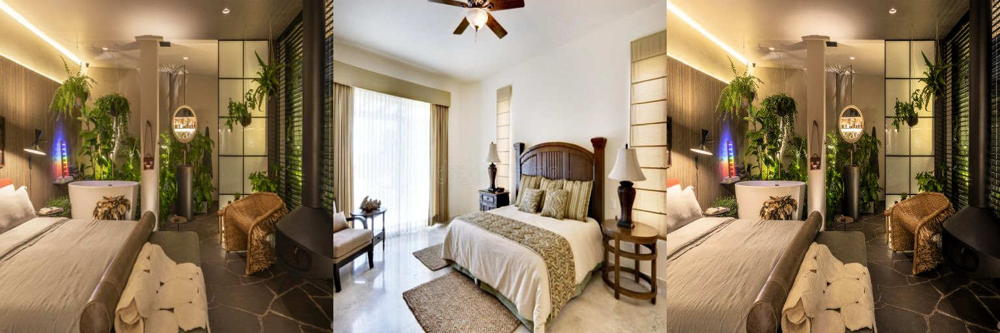

In [102]:
displayimg3 = np.concatenate((src,src2,finalImageHistEq),axis=1)
cv2_imshow(displayimg3)

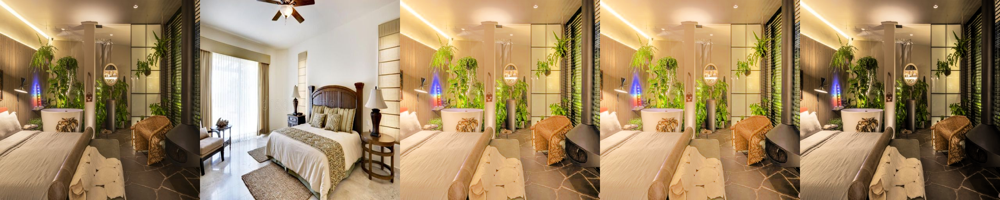

In [103]:
displayimg4 = np.concatenate((src,src2,finalImageMon,finalImageEquality,finalImageHistEq),axis=1)
cv2_imshow(displayimg4)

Original low light Image, Original medium light Image, Histogram Specification, Histogram Specification with Equality Constraint, Histogram Equalization